# Runs the enrichment methods on the E18 hypo data, including ROC curves and negative gene sets consideration with each scoring approach.
                                                                                        
### INPUT: 

 * data/dev_data/np-da_bfs.h5ad
 
### OUTPUT: 

 * NONE, plots within
 
## Environment Setup

In [2]:
work_dir = './' #Path to where cloned Cytocipher_manuscript/ repo
import os, sys
os.chdir(work_dir)

import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib
import matplotlib.pyplot as plt

from sklearn.metrics import pairwise_distances

import utils.visualisation.helpers as vhs
import utils.visualisation.quick_plots as qpl
qpl.setUp()

import seaborn as sb

import importlib as imp

import cytocipher.score_and_merge.cluster_score as cs
imp.reload(cs)

data_dir = 'data/dev_data/'

## Load the data

In [2]:
data = sc.read_h5ad(data_dir+'np-da_bfs.h5ad')

In [3]:
data.obs.keys()

Index(['experiment', 'treatment', 'sex', 'day', 'treatment_day',
       'total_counts', 'cellType', 'cellType_score', 'biological_filter',
       'NP-DA_cells', 'broad_labels', 'leiden', 'np_labels'],
      dtype='object')

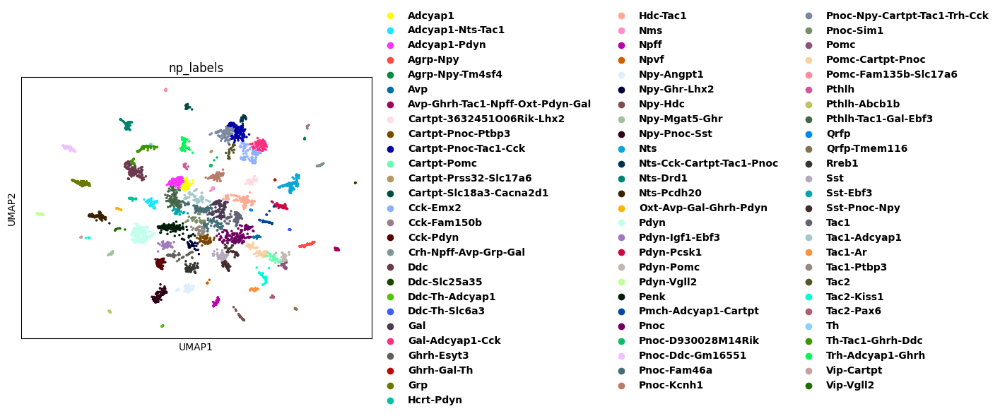

In [4]:
sc.pl.umap(data, color='np_labels')

In [5]:
#### So i don't have to update labels below... and also to prevent some naming issues with single gene names.
new_labels = {ct: f'{i}-{ct}' for i, ct in enumerate(data.obs['np_labels'].cat.categories)}
data.obs['cell_type'] = [new_labels[ct] for i, ct in enumerate(data.obs['np_labels'])]
data.obs['cell_type'] = data.obs['cell_type'].astype('category')
colors = {f'{i}-{ct}': data.uns['np_labels_colors'][i] 
            for i, ct in enumerate(data.obs['np_labels'].cat.categories)}
data.uns['cell_type_colors'] = [colors[ct] for ct in data.obs['cell_type'].cat.categories]

In [6]:
cell_types = np.array(list(data.obs['cell_type'].cat.categories))
order = [np.where([label.startswith(str(i)) for label in cell_types])[0][0] for i in range(len(cell_types))]
cell_types = cell_types[order]
data.obs['cell_type'] = data.obs['cell_type'].cat.set_categories(cell_types)
data.uns['cell_type_colors'] = list(np.array(data.uns['cell_type_colors'])[order])

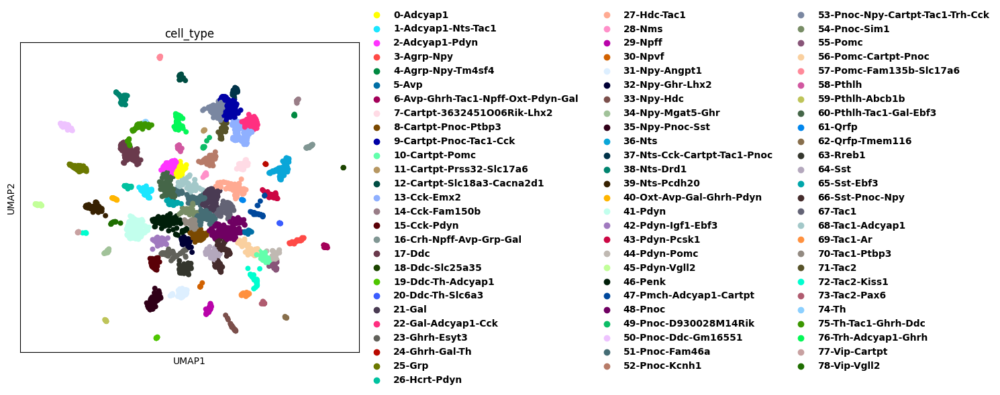

In [7]:
fig, ax = plt.subplots(figsize=(15, 6))
sc.pl.umap(data, color='cell_type', show=False, ax=ax, size=130)
plt.show()

## Setting up info about the DE gene groups

In [8]:
#### Want to exclude mito and ribo's from option for cluster markers...
mito_bool = np.array([gene.startswith('mt-') for gene in data.var_names])
ribo_bool = np.array([gene.startswith('Rpl') or gene.startswith('Rps')
                         for gene in data.var_names])
keep_bool = np.logical_and(mito_bool==False, ribo_bool==False)

print(sum(keep_bool))
data.var['not_mito_ribo'] = keep_bool

16957


In [ ]:
cs.get_markers(data, 'cell_type',
               var_groups='not_mito_ribo',
                logfc_cutoff = 0, padj_cutoff = .05,
                t_cutoff=10,
                n_top = 6, rerun_de = True # Only for running first time...
              )

In [10]:
cts = list(data.obs['cell_type'].cat.categories)
group_to_de = {ct: ct.split('-')[1:] for ct in cts}
group_to_de

{'0-Adcyap1': ['Adcyap1'],
 '1-Adcyap1-Nts-Tac1': ['Adcyap1', 'Nts', 'Tac1'],
 '2-Adcyap1-Pdyn': ['Adcyap1', 'Pdyn'],
 '3-Agrp-Npy': ['Agrp', 'Npy'],
 '4-Agrp-Npy-Tm4sf4': ['Agrp', 'Npy', 'Tm4sf4'],
 '5-Avp': ['Avp'],
 '6-Avp-Ghrh-Tac1-Npff-Oxt-Pdyn-Gal': ['Avp',
  'Ghrh',
  'Tac1',
  'Npff',
  'Oxt',
  'Pdyn',
  'Gal'],
 '7-Cartpt-3632451O06Rik-Lhx2': ['Cartpt', '3632451O06Rik', 'Lhx2'],
 '8-Cartpt-Pnoc-Ptbp3': ['Cartpt', 'Pnoc', 'Ptbp3'],
 '9-Cartpt-Pnoc-Tac1-Cck': ['Cartpt', 'Pnoc', 'Tac1', 'Cck'],
 '10-Cartpt-Pomc': ['Cartpt', 'Pomc'],
 '11-Cartpt-Prss32-Slc17a6': ['Cartpt', 'Prss32', 'Slc17a6'],
 '12-Cartpt-Slc18a3-Cacna2d1': ['Cartpt', 'Slc18a3', 'Cacna2d1'],
 '13-Cck-Emx2': ['Cck', 'Emx2'],
 '14-Cck-Fam150b': ['Cck', 'Fam150b'],
 '15-Cck-Pdyn': ['Cck', 'Pdyn'],
 '16-Crh-Npff-Avp-Grp-Gal': ['Crh', 'Npff', 'Avp', 'Grp', 'Gal'],
 '17-Ddc': ['Ddc'],
 '18-Ddc-Slc25a35': ['Ddc', 'Slc25a35'],
 '19-Ddc-Th-Adcyap1': ['Ddc', 'Th', 'Adcyap1'],
 '20-Ddc-Th-Slc6a3': ['Ddc', 'Th', 'Slc6a3'],


In [11]:
data.uns['cell_type_markers'] = group_to_de

## Running neurotools code enrichment method

In [12]:
imp.reload(cs)

<module 'cytocipher.score_and_merge.cluster_score' from '/Users/uqbbalde/Desktop/Uni_Studies/myPython/neurotools/cytocipher/score_and_merge/cluster_score.py'>

In [14]:
?cs.code_enrich

In [ ]:
cs.code_enrich(data, 'cell_type', cluster_marker_key='cell_type_markers')
data.obsm['code_enrich_scores'] = data.obsm['cell_type_enrich_scores']

In [14]:
data.obsm['cell_type_enrich_scores']

,0-Adcyap1,1-Adcyap1-Nts-Tac1,2-Adcyap1-Pdyn,3-Agrp-Npy,4-Agrp-Npy-Tm4sf4,5-Avp,6-Avp-Ghrh-Tac1-Npff-Oxt-Pdyn-Gal,7-Cartpt-3632451O06Rik-Lhx2,8-Cartpt-Pnoc-Ptbp3,9-Cartpt-Pnoc-Tac1-Cck,...,69-Tac1-Ar,70-Tac1-Ptbp3,71-Tac2,72-Tac2-Kiss1,73-Tac2-Pax6,74-Th,75-Th-Tac1-Ghrh-Ddc,76-Trh-Adcyap1-Ghrh,77-Vip-Cartpt,78-Vip-Vgll2
F4650_E1S1_WT_F_E18_S1_taccgaccacgcgactcg,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
F4650_E1S1_WT_F_E18_S1_atacttaattggactgca,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
F4650_E1S1_WT_F_E18_S1_gctgagcgcatatcgcct,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
F4650_E1S1_WT_F_E18_S1_accttcgagtgattcgca,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
F4650_E1S1_WT_F_E18_S1_cagactgtcggcgccaga,0.0,0.0,8.528333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
F4650_E2S8_WT_M_E18_S1_gcgaatgaggccaacgtg,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
F4650_E2S8_WT_M_E18_S1_cgaaagcactgtgaaggg,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
F4650_E2S8_WT_M_E18_S1_tcgcctggtgctggtgct,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
F4650_E2S8_WT_M_E18_S1_ctcaatggtaggaggtta,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
col = 'cell_type'
clusters = data.obsm[f'{col}_enrich_scores'].columns.values.astype(str)
scores = data.obsm[f'{col}_enrich_scores'].values
for clusteri, cluster in enumerate(clusters):
    data.obs[ f'{cluster}_' ] = scores[:,clusteri]
    
    fig, axes = plt.subplots(ncols=2, figsize=(10, 5))
    axes = axes.ravel()
    sc.pl.umap(data, color=col, ax=axes[0], groups=[cluster], show=False)
    sc.pl.umap(data, color=f'{cluster}_', ax=axes[1], show=False)
    plt.show()

## Let's actually visualise as a heatmap...

In [18]:
import cytocipher.plotting.cluster_diagnostics as cd
imp.reload(cd)
cd.enrich_heatmap(data, 'cell_type', per_cell=False, scale_rows=True, scale_cols=True, figsize=(100,100),
                 dendrogram=False, show=False)
plt.show()

/Users/uqbbalde/Desktop/Uni_Studies/myPython/neurotools/cytocipher/plotting/cluster_diagnostics.py:111: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  score_data = sc.AnnData(cell_scores_df, obs=data.obs)
/Users/uqbbalde/Desktop/Uni_Studies/myPython/BeautifulCells/beautifulcells/visualisation/helpers.py:19: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


In [19]:
#### Do per cell, but subset to x cells per cell type so can see...
cell_indices = []
labels = data.obs['cell_type'].values.astype(str)
label_set = np.unique( labels )
for i, label in enumerate(label_set):
    indices = np.where(labels==label)[0]
    cell_indices.extend( np.random.choice(indices, min([len(indices), 50]), replace=False) )

In [20]:
cd.enrich_heatmap(data[cell_indices], 'cell_type', per_cell=True, scale_rows=True, scale_cols=True, figsize=(100,100),
                 dendrogram=False, show=False)
plt.show()

/Users/uqbbalde/Desktop/Uni_Studies/myPython/neurotools/cytocipher/plotting/cluster_diagnostics.py:111: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  score_data = sc.AnnData(cell_scores_df, obs=data.obs)
/Users/uqbbalde/Desktop/Uni_Studies/myPython/BeautifulCells/beautifulcells/visualisation/helpers.py:19: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


## Now let's try not considering the combinatorics..

In [ ]:
cs.coexpr_enrich(data, 'cell_type', cluster_marker_key='cell_type_markers')
data.obsm['coexpr_enrich_scores'] = data.obsm['cell_type_enrich_scores']

In [ ]:
col = 'cell_type'
clusters = data.obsm[f'{col}_enrich_scores'].columns.values.astype(str)
scores = data.obsm[f'{col}_enrich_scores'].values
for clusteri, cluster in enumerate(clusters):
    data.obs[ f'{cluster}_' ] = scores[:,clusteri]
    
    fig, axes = plt.subplots(ncols=2, figsize=(10, 5))
    axes = axes.ravel()
    sc.pl.umap(data, color=col, ax=axes[0], groups=[cluster], show=False)
    sc.pl.umap(data, color=f'{cluster}_', ax=axes[1], show=False)
    plt.show()

In [29]:
import cytocipher.plotting.cluster_diagnostics as cd
imp.reload(cd)
cd.enrich_heatmap(data, 'cell_type', per_cell=False, scale_rows=True, scale_cols=True, figsize=(100,100),
                 dendrogram=False, show=False)
plt.show()

/Users/uqbbalde/Desktop/Uni_Studies/myPython/neurotools/cytocipher/plotting/cluster_diagnostics.py:111: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  score_data = sc.AnnData(cell_scores_df, obs=data.obs)
/Users/uqbbalde/Desktop/Uni_Studies/myPython/BeautifulCells/beautifulcells/visualisation/helpers.py:19: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


In [30]:
cd.enrich_heatmap(data[cell_indices], 'cell_type', per_cell=True, scale_rows=True, scale_cols=True, figsize=(100,100),
                 dendrogram=False, show=False)
plt.show()

/Users/uqbbalde/Desktop/Uni_Studies/myPython/neurotools/cytocipher/plotting/cluster_diagnostics.py:111: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  score_data = sc.AnnData(cell_scores_df, obs=data.obs)
/Users/uqbbalde/Desktop/Uni_Studies/myPython/BeautifulCells/beautifulcells/visualisation/helpers.py:19: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


## Now let's try with Giotto scoring

In [ ]:
cs.giotto_page_enrich(data, 'cell_type', cluster_marker_key='cell_type_markers')
data.obsm['giotto_enrich_scores'] = data.obsm['cell_type_enrich_scores']

In [ ]:
cmap = 'inferno'
s = 100
for clusteri, cluster in enumerate(clusters):

    fig, ax = plt.subplots(figsize=(5.65, 5))
    sc.pl.umap(data, color=col, ax=ax, groups=[cluster], show=False, size=s)
    plt.show()
    
    fig, ax = plt.subplots(figsize=(5, 5))
    sc.pl.umap(data, color=f'{cluster}_', ax=ax, show=False, cmap=cmap, size=s)
    plt.show()

In [74]:
import cytocipher.plotting.cluster_diagnostics as cd
imp.reload(cd)
cd.enrich_heatmap(data, 'cell_type', per_cell=False, scale_rows=True, scale_cols=True, figsize=(100,100),
                 dendrogram=False, show=False)
plt.show()

/Users/uqbbalde/Desktop/Uni_Studies/myPython/neurotools/cytocipher/plotting/cluster_diagnostics.py:111: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  score_data = sc.AnnData(cell_scores_df, obs=data.obs)
/Users/uqbbalde/Desktop/Uni_Studies/myPython/BeautifulCells/beautifulcells/visualisation/helpers.py:19: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


In [75]:
cd.enrich_heatmap(data[cell_indices], 'cell_type', per_cell=True, scale_rows=True, scale_cols=True, figsize=(100,100),
                  dendrogram=False, show=False)
plt.show()

/Users/uqbbalde/Desktop/Uni_Studies/myPython/neurotools/cytocipher/plotting/cluster_diagnostics.py:111: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  score_data = sc.AnnData(cell_scores_df, obs=data.obs)
/Users/uqbbalde/Desktop/Uni_Studies/myPython/BeautifulCells/beautifulcells/visualisation/helpers.py:19: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


## Now let's try with scanpy

In [76]:
group_to_de

{'0-Adcyap1': ['Adcyap1'],
 '1-Adcyap1-Nts-Tac1': ['Adcyap1', 'Nts', 'Tac1'],
 '2-Adcyap1-Pdyn': ['Adcyap1', 'Pdyn'],
 '3-Agrp-Npy': ['Agrp', 'Npy'],
 '4-Agrp-Npy-Tm4sf4': ['Agrp', 'Npy', 'Tm4sf4'],
 '5-Avp': ['Avp'],
 '6-Avp-Ghrh-Tac1-Npff-Oxt-Pdyn-Gal': ['Avp',
  'Ghrh',
  'Tac1',
  'Npff',
  'Oxt',
  'Pdyn',
  'Gal'],
 '7-Cartpt-3632451O06Rik-Lhx2': ['Cartpt', '3632451O06Rik', 'Lhx2'],
 '8-Cartpt-Pnoc-Ptbp3': ['Cartpt', 'Pnoc', 'Ptbp3'],
 '9-Cartpt-Pnoc-Tac1-Cck': ['Cartpt', 'Pnoc', 'Tac1', 'Cck'],
 '10-Cartpt-Pomc': ['Cartpt', 'Pomc'],
 '11-Cartpt-Prss32-Slc17a6': ['Cartpt', 'Prss32', 'Slc17a6'],
 '12-Cartpt-Slc18a3-Cacna2d1': ['Cartpt', 'Slc18a3', 'Cacna2d1'],
 '13-Cck-Emx2': ['Cck', 'Emx2'],
 '14-Cck-Fam150b': ['Cck', 'Fam150b'],
 '15-Cck-Pdyn': ['Cck', 'Pdyn'],
 '16-Crh-Npff-Avp-Grp-Gal': ['Crh', 'Npff', 'Avp', 'Grp', 'Gal'],
 '17-Ddc': ['Ddc'],
 '18-Ddc-Slc25a35': ['Ddc', 'Slc25a35'],
 '19-Ddc-Th-Adcyap1': ['Ddc', 'Th', 'Adcyap1'],
 '20-Ddc-Th-Slc6a3': ['Ddc', 'Th', 'Slc6a3'],


In [ ]:
scanpy_scores = np.zeros((data.shape[0], len(group_to_de)))
for i, group in enumerate(group_to_de):
    sc.tl.score_genes(data, group_to_de[group])
    scanpy_scores[:,i] = data.obs['score'].values
    
scanpy_scores = pd.DataFrame(scanpy_scores, index=data.obs_names, columns = list(group_to_de.keys()))

data.obsm['cell_type_enrich_scores'] = scanpy_scores
data.obsm['scanpy_enrich_scores'] = data.obsm['cell_type_enrich_scores']

In [ ]:
col = 'cell_type'
clusters = data.obsm[f'{col}_enrich_scores'].columns.values.astype(str)
scores = data.obsm[f'{col}_enrich_scores'].values
for clusteri, cluster in enumerate(clusters):
    data.obs[ f'{cluster}_' ] = scores[:,clusteri]
    
    fig, axes = plt.subplots(ncols=2, figsize=(10, 5))
    axes = axes.ravel()
    sc.pl.umap(data, color=col, ax=axes[0], groups=[cluster], show=False)
    sc.pl.umap(data, color=f'{cluster}_', ax=axes[1], show=False)
    plt.show()

In [78]:
import cytocipher.plotting.cluster_diagnostics as cd
imp.reload(cd)
cd.enrich_heatmap(data, 'cell_type', per_cell=False, scale_rows=True, scale_cols=True, figsize=(100,100),
                 dendrogram=False, show=False)
plt.show()

/Users/uqbbalde/Desktop/Uni_Studies/myPython/neurotools/cytocipher/plotting/cluster_diagnostics.py:111: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  score_data = sc.AnnData(cell_scores_df, obs=data.obs)
/Users/uqbbalde/Desktop/Uni_Studies/myPython/BeautifulCells/beautifulcells/visualisation/helpers.py:19: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


In [79]:
cd.enrich_heatmap(data[cell_indices], 'cell_type', per_cell=True, scale_rows=True, scale_cols=True, figsize=(100,100),
                 dendrogram=False, show=False)
plt.show()

/Users/uqbbalde/Desktop/Uni_Studies/myPython/neurotools/cytocipher/plotting/cluster_diagnostics.py:111: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  score_data = sc.AnnData(cell_scores_df, obs=data.obs)
/Users/uqbbalde/Desktop/Uni_Studies/myPython/BeautifulCells/beautifulcells/visualisation/helpers.py:19: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


## Negative gene set score=0

#### To determine the negative gene set cells, will find zero scoring cells in code-score, that are not 0 in coexpr-score (these are the negative set co-expressing cells).

In [80]:
code_scores = data.obsm['code_enrich_scores']
coexpr_scores = data.obsm['coexpr_enrich_scores']

negative_set_cells = np.logical_and(code_scores==0, coexpr_scores>0)

In [81]:
giotto_neg_scores = data.obsm['giotto_enrich_scores'].copy()
scanpy_neg_scores = data.obsm['scanpy_enrich_scores'].copy()

giotto_neg_scores[negative_set_cells] = 0
scanpy_neg_scores[negative_set_cells] = 0

data.obsm['giotto-neg_enrich_scores'] = giotto_neg_scores
data.obsm['scanpy-neg_enrich_scores'] = scanpy_neg_scores

## Comparing methods head-to-head

Now comparing methods by:

    1) Classification case, using ROC curve
    2) Comparing distribution of specificity scores

### Classification accuracy

Following tutorial here:
https://scikit-learn.org/stable/auto_examples/model_selection/plot_roc.html#sphx-glr-auto-examples-model-selection-plot-roc-py

In [82]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_auc_score, confusion_matrix, accuracy_score, f1_score, \
                                precision_score, recall_score, zero_one_loss

from sklearn import svm, datasets

In [83]:
methods = ['code', 'coexpr', 'giotto', 'scanpy']
method_colors = {'code': 'cyan', 'coexpr': 'dodgerblue',
                'giotto': 'magenta', 'scanpy': 'gold'}

In [84]:
# Binarize the output
y = data.obs['cell_type'].values.astype(str)

classes = np.unique(y)
print(classes)

y = label_binarize(y, classes=classes)
n_classes = y.shape[1]

print(n_classes)
print(y)
print(y.shape)

['0-Adcyap1' '1-Adcyap1-Nts-Tac1' '10-Cartpt-Pomc'
 '11-Cartpt-Prss32-Slc17a6' '12-Cartpt-Slc18a3-Cacna2d1' '13-Cck-Emx2'
 '14-Cck-Fam150b' '15-Cck-Pdyn' '16-Crh-Npff-Avp-Grp-Gal' '17-Ddc'
 '18-Ddc-Slc25a35' '19-Ddc-Th-Adcyap1' '2-Adcyap1-Pdyn' '20-Ddc-Th-Slc6a3'
 '21-Gal' '22-Gal-Adcyap1-Cck' '23-Ghrh-Esyt3' '24-Ghrh-Gal-Th' '25-Grp'
 '26-Hcrt-Pdyn' '27-Hdc-Tac1' '28-Nms' '29-Npff' '3-Agrp-Npy' '30-Npvf'
 '31-Npy-Angpt1' '32-Npy-Ghr-Lhx2' '33-Npy-Hdc' '34-Npy-Mgat5-Ghr'
 '35-Npy-Pnoc-Sst' '36-Nts' '37-Nts-Cck-Cartpt-Tac1-Pnoc' '38-Nts-Drd1'
 '39-Nts-Pcdh20' '4-Agrp-Npy-Tm4sf4' '40-Oxt-Avp-Gal-Ghrh-Pdyn' '41-Pdyn'
 '42-Pdyn-Igf1-Ebf3' '43-Pdyn-Pcsk1' '44-Pdyn-Pomc' '45-Pdyn-Vgll2'
 '46-Penk' '47-Pmch-Adcyap1-Cartpt' '48-Pnoc' '49-Pnoc-D930028M14Rik'
 '5-Avp' '50-Pnoc-Ddc-Gm16551' '51-Pnoc-Fam46a' '52-Pnoc-Kcnh1'
 '53-Pnoc-Npy-Cartpt-Tac1-Trh-Cck' '54-Pnoc-Sim1' '55-Pomc'
 '56-Pomc-Cartpt-Pnoc' '57-Pomc-Fam135b-Slc17a6' '58-Pthlh'
 '59-Pthlh-Abcb1b' '6-Avp-Ghrh-Tac1-Npff-Oxt-Pdyn-Gal'
 

In [85]:
data.obsm.keys()

KeysView(AxisArrays with keys: X_pca, X_umap, cell_type_enrich_scores, code_enrich_scores, coexpr_enrich_scores, giotto_enrich_scores, scanpy_enrich_scores, giotto-neg_enrich_scores, scanpy-neg_enrich_scores)

In [ ]:
results = np.zeros((len(methods)*y.shape[1], 5))

rowi = 0

method_label = []
ct_label = []

avg_method='binary'
for i, method in enumerate(methods):
    y_scores = data.obsm[f'{method}_enrich_scores'].values
        
    for j in range(y.shape[1]):
        
        y_true = y[:,j]
        y_pred = (y_scores[:,j] > 0).astype(int)
        
        results[rowi, 0] = accuracy_score(y_true, y_pred)
        results[rowi, 1] = f1_score(y_true, y_pred, average=avg_method)
        results[rowi, 2] = precision_score(y_true, y_pred, average=avg_method)
        results[rowi, 3] = recall_score(y_true, y_pred, average=avg_method)
        results[rowi, 4] = zero_one_loss(y_true, y_pred)

        rowi += 1
        method_label.append( method )
        ct_label.append( classes[j] )
        
results = pd.DataFrame(results, columns=['accuracy', 'f1_score', 'precision', 
                                         'recall', 'zero_one_loss'])
results = sc.AnnData(results)
results.obs['method'] = method_label
results.obs['method'] = results.obs['method'].astype('category')
results.obs['cell_type'] = ct_label
results.obs['cell_type'] = results.obs['cell_type'].astype('category')

results.uns['method_colors'] = [method_colors[val] for val in results.obs['method'].cat.categories]

/Users/uqbbalde/Desktop/Uni_Studies/myPython/BeautifulCells/beautifulcells/visualisation/helpers.py:19: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


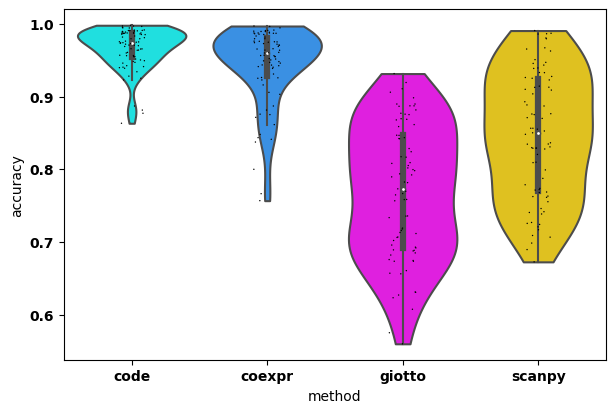

/Users/uqbbalde/Desktop/Uni_Studies/myPython/BeautifulCells/beautifulcells/visualisation/helpers.py:19: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


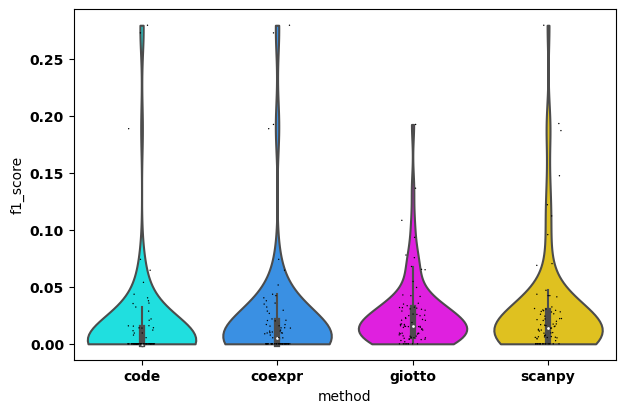

/Users/uqbbalde/Desktop/Uni_Studies/myPython/BeautifulCells/beautifulcells/visualisation/helpers.py:19: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


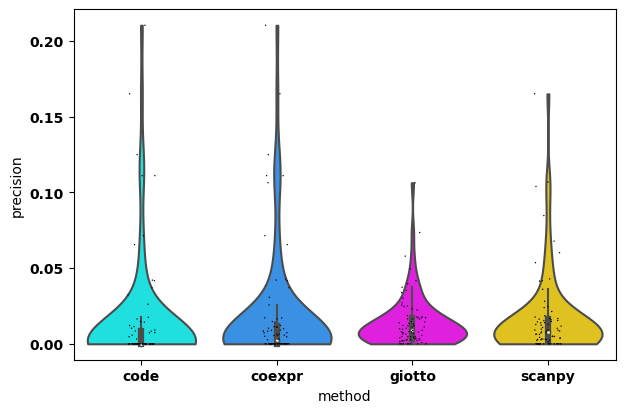

/Users/uqbbalde/Desktop/Uni_Studies/myPython/BeautifulCells/beautifulcells/visualisation/helpers.py:19: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


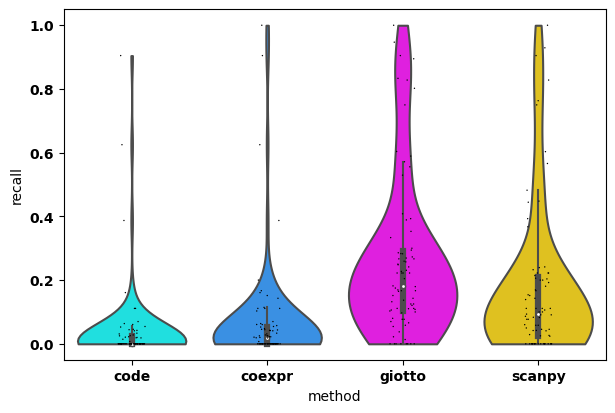

/Users/uqbbalde/Desktop/Uni_Studies/myPython/BeautifulCells/beautifulcells/visualisation/helpers.py:19: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


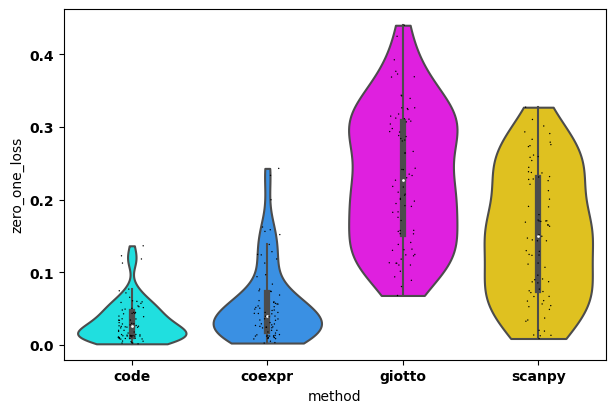

In [87]:
sc.pl.violin(results, 'accuracy', groupby='method', inner='box', show=False, vmin=0)
plt.show()
sc.pl.violin(results, 'f1_score', groupby='method', inner='box', show=False, vmin=0)
plt.show()
sc.pl.violin(results, 'precision', groupby='method', inner='box', show=False, vmin=0)
plt.show()
sc.pl.violin(results, 'recall', groupby='method', inner='box', show=False, vmin=0)
plt.show()
sc.pl.violin(results, 'zero_one_loss', groupby='method', inner='box', show=False, vmin=0)
plt.show()

### Now with negative gene set scoring...

In [88]:
methods = ['code', 'coexpr', 'giotto', 'giotto-neg', 'scanpy', 'scanpy-neg']
method_colors = {'code': 'cyan', 'coexpr': 'dodgerblue',
                'giotto': 'magenta', 'giotto-neg': 'orchid', 
                 'scanpy': 'gold', 'scanpy-neg': 'goldenrod'}

In [ ]:
results = np.zeros((len(methods)*y.shape[1], 5))

rowi = 0

method_label = []
ct_label = []

avg_method='binary'
for i, method in enumerate(methods):
    y_scores = data.obsm[f'{method}_enrich_scores'].values
        
    for j in range(y.shape[1]):
        
        y_true = y[:,j]
        y_pred = (y_scores[:,j] > 0).astype(int)
        
        results[rowi, 0] = accuracy_score(y_true, y_pred)
        results[rowi, 1] = f1_score(y_true, y_pred, average=avg_method)
        results[rowi, 2] = precision_score(y_true, y_pred, average=avg_method)
        results[rowi, 3] = recall_score(y_true, y_pred, average=avg_method)
        results[rowi, 4] = zero_one_loss(y_true, y_pred)

        rowi += 1
        method_label.append( method )
        ct_label.append( classes[j] )
        
results = pd.DataFrame(results, columns=['accuracy', 'f1_score', 'precision', 
                                         'recall', 'zero_one_loss'])
results = sc.AnnData(results)
results.obs['method'] = method_label
results.obs['method'] = results.obs['method'].astype('category')
results.obs['cell_type'] = ct_label
results.obs['cell_type'] = results.obs['cell_type'].astype('category')

results.uns['method_colors'] = [method_colors[val] for val in results.obs['method'].cat.categories]

In [90]:
method_label = np.array(method_label)
result_df = results.to_df()
for method in methods:
    
    method_df = result_df.loc[method_label==method,:]
    print(method)
    print(method_df.mean())

code
accuracy         0.967082
f1_score         0.017388
precision        0.015066
recall           0.038453
zero_one_loss    0.032918
dtype: float32
coexpr
accuracy         0.943804
f1_score         0.022533
precision        0.018085
recall           0.067216
zero_one_loss    0.056196
dtype: float32
giotto
accuracy         0.769559
f1_score         0.026014
precision        0.014241
recall           0.260155
zero_one_loss    0.230441
dtype: float32
giotto-neg
accuracy         0.792259
f1_score         0.022574
precision        0.012356
recall           0.231572
zero_one_loss    0.207741
dtype: float32
scanpy
accuracy         0.846790
f1_score         0.028462
precision        0.016558
recall           0.179182
zero_one_loss    0.153210
dtype: float32
scanpy-neg
accuracy         0.865357
f1_score         0.024717
precision        0.014283
recall           0.154922
zero_one_loss    0.134643
dtype: float32


/Users/uqbbalde/Desktop/Uni_Studies/myPython/BeautifulCells/beautifulcells/visualisation/helpers.py:19: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


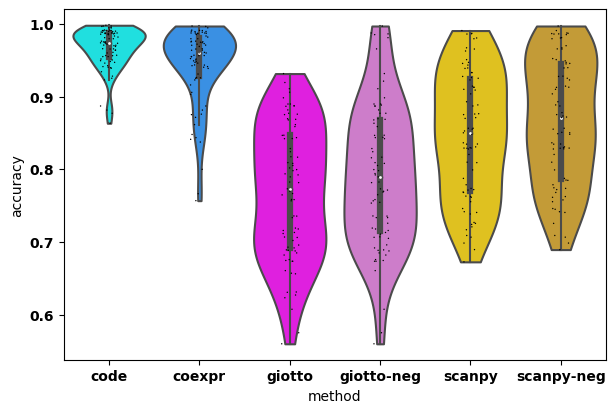

/Users/uqbbalde/Desktop/Uni_Studies/myPython/BeautifulCells/beautifulcells/visualisation/helpers.py:19: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


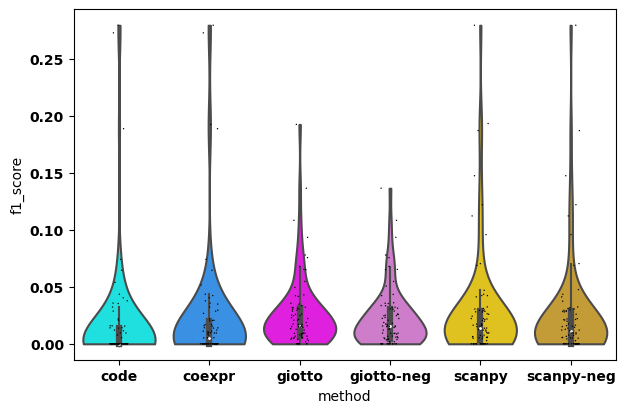

/Users/uqbbalde/Desktop/Uni_Studies/myPython/BeautifulCells/beautifulcells/visualisation/helpers.py:19: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


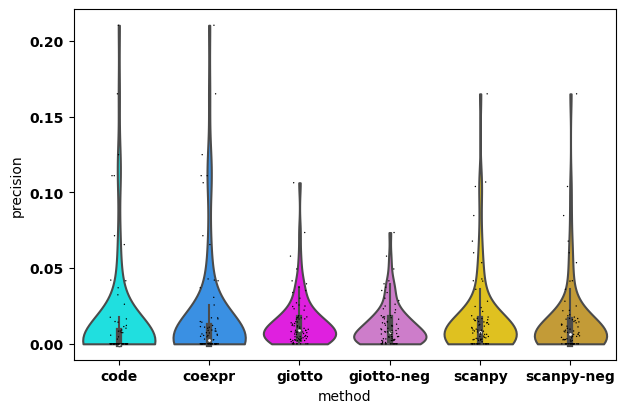

/Users/uqbbalde/Desktop/Uni_Studies/myPython/BeautifulCells/beautifulcells/visualisation/helpers.py:19: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


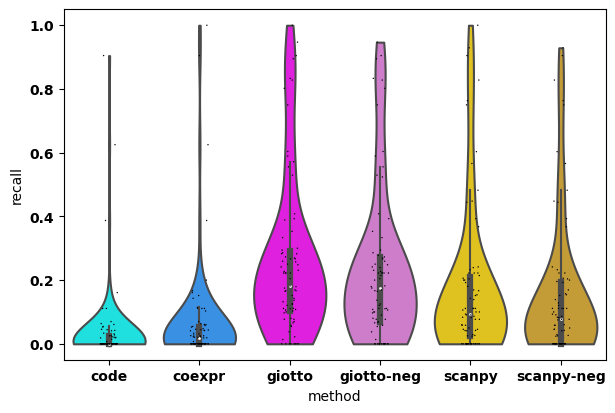

/Users/uqbbalde/Desktop/Uni_Studies/myPython/BeautifulCells/beautifulcells/visualisation/helpers.py:19: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


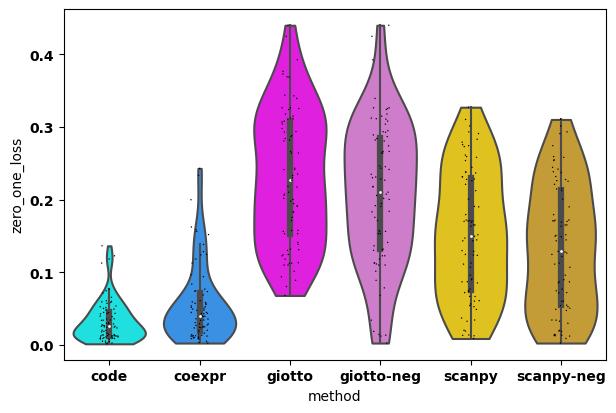

In [91]:
sc.pl.violin(results, 'accuracy', groupby='method', inner='box', show=False, vmin=0)
plt.show()
sc.pl.violin(results, 'f1_score', groupby='method', inner='box', show=False, vmin=0)
plt.show()
sc.pl.violin(results, 'precision', groupby='method', inner='box', show=False, vmin=0)
plt.show()
sc.pl.violin(results, 'recall', groupby='method', inner='box', show=False, vmin=0)
plt.show()
sc.pl.violin(results, 'zero_one_loss', groupby='method', inner='box', show=False, vmin=0)
plt.show()

## ROC Curve Validation

In [92]:
truth_col = 'cell_type'
truth_labels = data.obs[truth_col].values.astype(str)
truth_set = np.unique( truth_labels )

n_subclusters = 3
overcluster_labels = np.array([' '*max([len(truth+'_number') for truth in truth_set])]*len(truth_labels))
n_cells = []
n_rand_cells = []
for i, truth in enumerate(truth_set):
    truth_indices = np.where( truth_labels==truth )[0]
    n_cells.append( len(truth_indices) )
    if len(truth_indices) > 20:
        n_rands = [len(truth_indices)//n_subclusters for i_ in range(n_subclusters)]
        n_rands[0] += len(truth_indices)%n_subclusters
    else:
        n_rands = [len(truth_indices)]
    
    sampled_indices = []
    for sampj in range(len(n_rands)):
        indices = np.random.choice([index for index in truth_indices if index not in sampled_indices], 
                                   n_rands[sampj], replace=False)
        sampled_indices.extend( indices )
        
        overcluster_labels[indices] = f'{truth}_{sampj}'
        n_rand_cells.append(len(indices))

In [93]:
### Now setting the overclusters...
data.obs[f'overclusters'] = overcluster_labels
data.obs[f'overclusters'] = data.obs[f'overclusters'].astype('category')

### Running Cytocipher cluster merge for each of the different approach on this over-clustered data.

In [94]:
import cytocipher as cc
import cytocipher.score_and_merge.cluster_merge as cm
imp.reload(cm)
imp.reload(cc.tl)

<module 'cytocipher.tl' from '/Users/uqbbalde/Desktop/Uni_Studies/myPython/neurotools/cytocipher/tl.py'>

In [ ]:
cc.tl.get_markers(data, 'overclusters', min_de=1)

## Scoring with each method

In [ ]:
cluster_key = 'overclusters'
marker_key = 'overclusters_markers'

### Code-scoring
cs.code_enrich(data, cluster_key, cluster_marker_key=marker_key, squash_exception=True)
data.obsm[f'code_{cluster_key}_enrich_scores'] = data.obsm[f'{cluster_key}_enrich_scores']

### Coexpr-scoring
cs.coexpr_enrich(data, cluster_key, cluster_marker_key=marker_key)
data.obsm[f'coexpr_{cluster_key}_enrich_scores'] = data.obsm[f'{cluster_key}_enrich_scores']

### Giotto-scoring
cs.giotto_page_enrich(data, cluster_key, cluster_marker_key=marker_key)
data.obsm[f'giotto_{cluster_key}_enrich_scores'] = data.obsm[f'{cluster_key}_enrich_scores']

### Scanpy-scoring
scanpy_scores = np.zeros((data.shape[0], len(data.uns[marker_key])))
for i, group in enumerate(data.uns[marker_key]):
    sc.tl.score_genes(data, data.uns[marker_key][group])
    scanpy_scores[:,i] = data.obs['score'].values
scanpy_scores = pd.DataFrame(scanpy_scores, index=data.obs_names, columns = list(data.uns[marker_key].keys()))
data.obsm[f'scanpy_{cluster_key}_enrich_scores'] = scanpy_scores

### Negative set score=0

In [100]:
code_scores = data.obsm[f'code_{cluster_key}_enrich_scores']
coexpr_scores = data.obsm[f'coexpr_{cluster_key}_enrich_scores']

negative_set_cells = np.logical_and(code_scores==0, coexpr_scores>0)

giotto_neg_scores = data.obsm[f'giotto_{cluster_key}_enrich_scores'].copy()
scanpy_neg_scores = data.obsm[f'scanpy_{cluster_key}_enrich_scores'].copy()

giotto_neg_scores[negative_set_cells] = 0
scanpy_neg_scores[negative_set_cells] = 0

data.obsm[f'giotto-neg_{cluster_key}_enrich_scores'] = giotto_neg_scores
data.obsm[f'scanpy-neg_{cluster_key}_enrich_scores'] = scanpy_neg_scores

### Getting cluster pair p-values

In [101]:
import cytocipher.score_and_merge.cluster_merge as cm
imp.reload(cm)

<module 'cytocipher.score_and_merge.cluster_merge' from '/Users/uqbbalde/Desktop/Uni_Studies/myPython/neurotools/cytocipher/score_and_merge/cluster_merge.py'>

In [102]:
methods = ['code', 'coexpr', 'giotto', 'giotto-neg', 'scanpy', 'scanpy-neg']
method_colors = {'code': 'cyan', 'coexpr': 'dodgerblue',
                'giotto': 'magenta', 'giotto-neg': 'orchid', 
                 'scanpy': 'gold', 'scanpy-neg': 'goldenrod'}

In [103]:
k=15
mnn_frac_cutoff=None
random_state=20
p_cut=0.01
score_group_method='quantiles'
p_adjust=True
p_adjust_method='fdr_bh'

In [104]:
method_ps = {}
for method in methods:
    data.obsm[f'{cluster_key}_enrich_scores'] = data.obsm[f'{method}_{cluster_key}_enrich_scores']
    cm.merge_clusters_single(data, cluster_key, f'{cluster_key}_merged',
                            k=k, mnn_frac_cutoff=mnn_frac_cutoff, random_state=random_state,
                          p_cut=p_cut,
                          score_group_method=score_group_method,
                          p_adjust=p_adjust, p_adjust_method=p_adjust_method,
                          verbose=False)
    
    method_ps[method] = data.uns[f'{cluster_key}_ps']

### Benchmarking with ROC and AUROC values.

In [105]:
##### Let's get true versus false pairs based on pairs which belong to same higher cluster...
groupby = 'overclusters'
pairs = np.array(list(data.uns[f'{groupby}_ps'].keys()))
pair_labels = []
pair_new_label = []

# Ground truth labels; clusters which mutually fall within one of these clusters should not be different.
ground_truth = data.obs['cell_type'].values.astype(str)
ground_truth_set = np.unique( ground_truth )
for pair in pairs:
    pair1 = [label for label in ground_truth_set if pair.split('_')[0]==label][0]
    pair1 = pair1+'_'+pair.split(pair1)[1].split('_')[1]
    pair2 = pair.split(pair1)[1].strip('_')
    #print(pair)
    #print(pair1, '---', pair2, '\n')
    truth1 = pair1.split('_')[0]
    truth2 = pair2.split('_')[0]
    
    if truth1 == truth2:
        pair_labels.append( 1 )
        pair_new_label.append( truth1 )
    else:
        pair_labels.append( 0 )
        pair_new_label.append('other')

pair_new_label = np.array(pair_new_label)
pair_labels = np.array( pair_labels )

In [106]:
pair.split('_')

['9-Cartpt-Pnoc-Tac1-Cck', '2', '9-Cartpt-Pnoc-Tac1-Cck', '1']

In [107]:
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import roc_auc_score

##### Logging to try and get a better range...
res = 300
p_cuts = np.array([2**(-i) for i in range(res)]+[0])[::-1]
p_cuts = p_cuts
p_cuts

array([0.00000000e+00, 9.81818693e-91, 1.96363739e-90, 3.92727477e-90,
       7.85454954e-90, 1.57090991e-89, 3.14181982e-89, 6.28363964e-89,
       1.25672793e-88, 2.51345585e-88, 5.02691171e-88, 1.00538234e-87,
       2.01076468e-87, 4.02152937e-87, 8.04305873e-87, 1.60861175e-86,
       3.21722349e-86, 6.43444699e-86, 1.28688940e-85, 2.57377879e-85,
       5.14755759e-85, 1.02951152e-84, 2.05902304e-84, 4.11804607e-84,
       8.23609214e-84, 1.64721843e-83, 3.29443686e-83, 6.58887371e-83,
       1.31777474e-82, 2.63554949e-82, 5.27109897e-82, 1.05421979e-81,
       2.10843959e-81, 4.21687918e-81, 8.43375835e-81, 1.68675167e-80,
       3.37350334e-80, 6.74700668e-80, 1.34940134e-79, 2.69880267e-79,
       5.39760535e-79, 1.07952107e-78, 2.15904214e-78, 4.31808428e-78,
       8.63616856e-78, 1.72723371e-77, 3.45446742e-77, 6.90893484e-77,
       1.38178697e-76, 2.76357394e-76, 5.52714788e-76, 1.10542958e-75,
       2.21085915e-75, 4.42171830e-75, 8.84343660e-75, 1.76868732e-74,
      

In [108]:
from statsmodels.stats.multitest import multipletests

##### Which method gets ground-truth best???
method_labels = []
adjust = False

method_fprs = {}
method_tprs = {}
method_aucs = {}

for j, method in enumerate(methods):

    # Get p-values
    pvals = np.array([method_ps[method][pair] for pair in pairs])
    # Randomising order just to make sure random is RANDOM!
    #pvals = np.random.choice(pvals, size=len(pvals), replace=False)
    if adjust:
        pvals = multipletests(pvals, method='fdr_bh')[1]
  
    # Compute ROC curve and ROC area for each class
    n_nonsig, n_sig = sum(pair_labels==1), sum(pair_labels==0)
    fpr, tpr = np.zeros((len(p_cuts))), np.zeros((len(p_cuts)))
    for pi, p_cut_ in enumerate(p_cuts):
        nonsig_bool = pvals >= p_cut_
        
        tp = sum(np.logical_and(nonsig_bool, pair_labels==1))
        tpr[pi] = tp / n_nonsig
        
        fp = sum(np.logical_and(nonsig_bool, pair_labels==0))
        #print(p_cut, fp)
        fpr[pi] = fp / n_sig
    
    #print(thresholds)
    roc_auc = auc(fpr, tpr)
    
    method_fprs[method] = fpr
    method_tprs[method] = tpr
    method_aucs[method] = roc_auc
    
    print(method, roc_auc)

code 0.9565317310005925
coexpr 0.9714507487493865
giotto 0.9605255937825036
giotto-neg 0.9484603934195764
scanpy 0.8721328417303393
scanpy-neg 0.8967061666572012


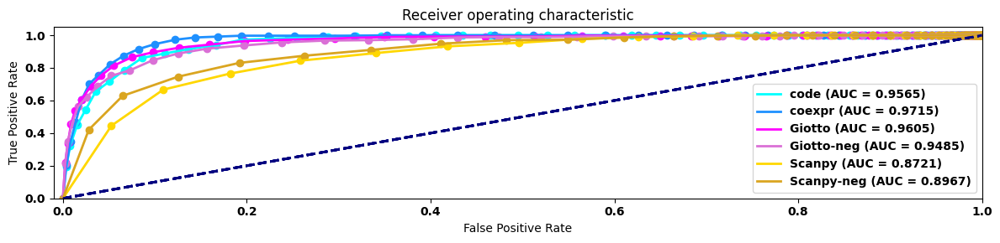

In [109]:
method_names = ['code', 'coexpr', 'Giotto', 'Giotto-neg', 'Scanpy', 'Scanpy-neg']

plt.figure(figsize=(12,3))
for j, method in enumerate(methods):
    fpr = method_fprs[method]
    tpr = method_tprs[method]
    roc_auc = method_aucs[method]

    lw = 2
    plt.plot(
        fpr,
        tpr,
        color=method_colors[method],
        lw=lw,
        label=f"{method_names[j]} (AUC = %0.4f)" % roc_auc,
    )
    plt.scatter(fpr, tpr, color=method_colors[method],)
    plt.plot([0, 1], [0, 1], color="navy", lw=lw, linestyle="--")
    plt.xlim([-0.01, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Receiver operating characteristic")
    plt.legend(loc="lower right")
vhs.dealWithPlot(True, True, True, out_plots, f'hypo_enrich-method_ROC_curve.pdf', 300)